In [1]:
import convml_tt
from convml_tt.system import TripletTrainerModel, TripletTrainerDataModule
from convml_tt.data.examples import fetch_example_dataset, ExampleData, fetch_pretrained_model, PretrainedModel
from convml_tt.data.dataset import TileType, ImageSingletDataset
from convml_tt.utils import get_embeddings
import convml_tt.interpretation
import cv2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import numpy as np
import xarray as xr
import pandas as pd
import pytorch_lightning as pl
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import torch
from sklearn.decomposition import PCA
from PIL import Image
import os, shutil
from matplotlib.patches import Rectangle as rectan
from random import seed
from random import randint


TILE_FILENAME_FORMAT = "{triplet_id:05d}_{tile_type}.png"
TEST_SIZE = 0.3
RANDOM_STATE = 1024
COLORS = ['b', 'g', 'r', 'm'] # Color of each class
DATASET_DIR = "../NC/zooniverse/"

pca = PCA(n_components=3, svd_solver='arpack')

In [2]:
model_path = fetch_pretrained_model(pretrained_model=PretrainedModel.FIXED_NORM_STAGE2, data_dir="../../")
model = TripletTrainerModel.load_from_checkpoint(checkpoint_path="c:/Users/Ray/Documents/Stage/MODELS/checkpt")

Using downloaded and verified file: ../../fixednorm-stage-2.tgz
Extracting ../../fixednorm-stage-2.tgz to ../../


In [3]:
df = pd.read_csv("../NC/zooniverse/train.csv")

In [4]:
print(df)

              Image_Label                                      EncodedPixels
0        0011165.jpg_Fish  264918 937 266318 937 267718 937 269118 937 27...
1      0011165.jpg_Flower  1355565 1002 1356965 1002 1358365 1002 1359765...
2      0011165.jpg_Gravel                                                NaN
3       0011165.jpg_Sugar                                                NaN
4        002be4f.jpg_Fish  233813 878 235213 878 236613 878 238010 881 23...
...                   ...                                                ...
22179   ffd6680.jpg_Sugar                                                NaN
22180    ffea4f4.jpg_Fish                                                NaN
22181  ffea4f4.jpg_Flower  1194860 675 1196260 675 1197660 675 1199060 67...
22182  ffea4f4.jpg_Gravel                                                NaN
22183   ffea4f4.jpg_Sugar                                                NaN

[22184 rows x 2 columns]


In [5]:
df['Image'] = df['Image_Label'].map(lambda x: x.split('_')[0])
df['Class'] = df['Image_Label'].map(lambda x: x.split('_')[1])
classes = df['Class'].unique()
train_df = df.groupby('Image')['Class'].agg(set).reset_index()
for class_name in classes:
    df[class_name] = df['Class'].map(lambda x: 1 if class_name in x else 0)
df.head()

,Image_Label,EncodedPixels,Image,Class,Fish,Flower,Gravel,Sugar
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...,0011165.jpg,Fish,1,0,0,0
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...,0011165.jpg,Flower,0,1,0,0
2,0011165.jpg_Gravel,NaN,0011165.jpg,Gravel,0,0,1,0
3,0011165.jpg_Sugar,NaN,0011165.jpg,Sugar,0,0,0,1
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...,002be4f.jpg,Fish,1,0,0,0


  0%|          | 0/9 [00:00<?, ?it/s]Class : Fish
out_name : tmp/train/00000_anchor.png shape : (256, 256, 3)
out_name : tmp/train/00001_anchor.png shape : (256, 256, 3)
out_name : tmp/train/00002_anchor.png shape : (256, 256, 3)
out_name : tmp/train/00003_anchor.png shape : (256, 256, 3)
out_name : tmp/train/00004_anchor.png shape : (256, 256, 3)
out_name : tmp/train/00005_anchor.png shape : (256, 256, 3)
out_name : tmp/train/00006_anchor.png shape : (256, 256, 3)
out_name : tmp/train/00007_anchor.png shape : (256, 256, 3)
out_name : tmp/train/00008_anchor.png shape : (256, 52, 3)
out_name : tmp/train/00008_anchor.png shape : (256, 256, 3)
out_name : tmp/train/00009_anchor.png shape : (256, 256, 3)
out_name : tmp/train/00010_anchor.png shape : (256, 256, 3)
out_name : tmp/train/00011_anchor.png shape : (256, 256, 3)
out_name : tmp/train/00012_anchor.png shape : (256, 256, 3)
out_name : tmp/train/00013_anchor.png shape : (256, 256, 3)
out_name : tmp/train/00014_anchor.png shape : (256,

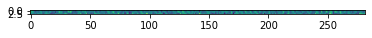

In [68]:

def rle2mask(mask_rle, shape=(2100, 1400)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (width,height) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T

def extract_contour(img, cnts, shown=False):
    #cnts = cnts[0] if len(cnts) == 2 else cnts[1]
    cnts = sorted(cnts, key=cv2.contourArea, reverse=True)
    rois = []
    # Find bounding box and extract ROI
    for c in cnts:
        x,y,w,h = cv2.boundingRect(c)
        ROI = img[y:y+h, x:x+w]
        rois.append(ROI)
    if not shown:
        plt.figure()
        plt.imshow(ROI)
    return rois

def predict_domain(image):
    deb_path = "tmp/train/"
    i = 0
    for x in range(0, image.shape[0], 256):
            for y in range(0, image.shape[1], 256):
                out_name =  TILE_FILENAME_FORMAT.format(triplet_id=i,tile_type='anchor')
                out_name = deb_path+out_name
                print("out_name : "+str(out_name)+" shape : "+str(image[x:x+256,y:y+256].shape))
                
                if image[x:x+256,y:y+256].shape != (256, 256, 3):
                    continue
                to_save = cv2.cvtColor(image[x:x+256,y:y+256], cv2.COLOR_BGR2RGB)
                cv2.imwrite(out_name, to_save)
                i += 1
    print("Number of images : "+str(i))
    dataset_path =  'tmp/'
    tile_dataset = ImageSingletDataset(data_dir=dataset_path, tile_type=TileType.ANCHOR)
    da_embeddings = get_embeddings(tile_dataset=tile_dataset, model=model)
    compressed = pca.fit_transform(da_embeddings)
    print("Embedding shape : "+str(da_embeddings.shape))
    print("Compressed PCA shape : "+str(compressed.shape))
    plt.imshow(compressed.T)
    return da_embeddings


for index, row in df.iterrows():
    #print(row['c1'], row['c2'])
    print("Class : "+str(row['Class']))
    path = '../NC/zooniverse/train_images/'+str(row['Image'])
    pixels = row['EncodedPixels']
    img = mpimg.imread(path)
    ig = img.copy()
    #print("IG SHAPE : "+str(ig.shape))
    
    #ig = (ig - np.min(ig))/np.ptp(ig) 
    embd = predict_domain(ig)
    #plt.imshow(ig)
    break







image_col = np.array(df['Image'])
image_files = image_col[::4]
all_labels = df['Class']
X_train, y_train = image_files, all_labels
train_pairs = np.array(list(zip(X_train, y_train)))
TILE_FILENAME_FORMAT = "{triplet_id:05d}_{tile_type}.png"
NUM_TRAIN_SAMPLES = len(train_pairs)
train_samples = train_pairs[np.random.choice(train_pairs.shape[0], NUM_TRAIN_SAMPLES, replace=False), :]

  0%|          | 0/5546 [00:00<?, ?it/s]

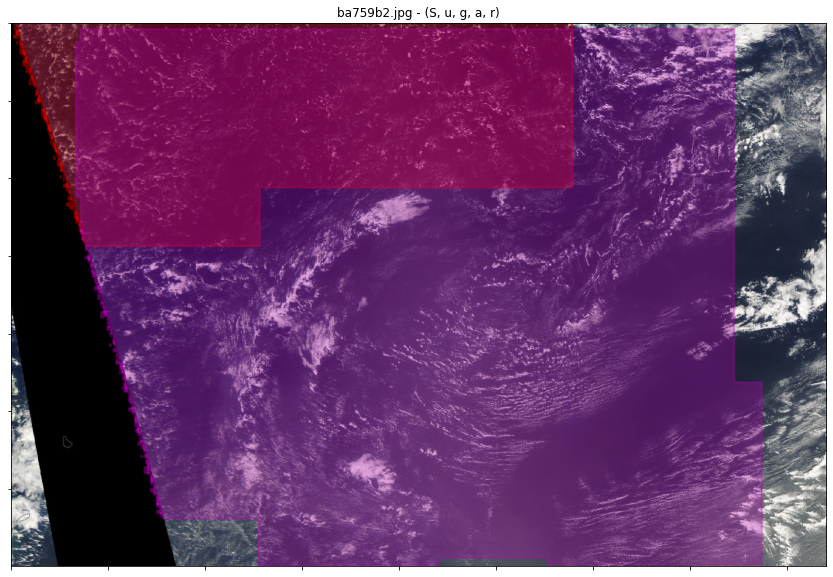

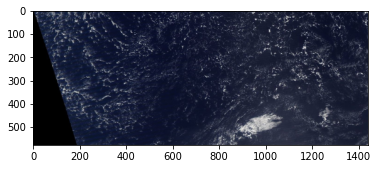

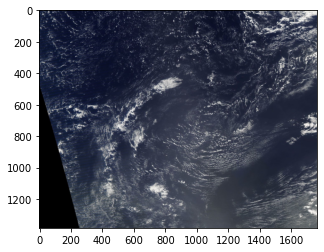

In [7]:
from tqdm.notebook import tqdm
labs = []
shown = False
t = 0
for sample in tqdm(train_samples):
        if not shown:
            fig, ax = plt.subplots(figsize=(15, 10))
        img_path = os.path.join(DATASET_DIR, 'train_images', sample[0])
        img = cv2.imread(img_path, 1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Get annotations
        labels = df[df['Image_Label'].str.contains(sample[0])]['EncodedPixels']

        patches = []
        for idx, rle in enumerate(labels.values):
            if rle is not np.nan:
                mask = rle2mask(rle)
                contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
                #print("Contours : "+str(contours))
                rgbImg = extract_contour(img, contours, shown=shown)
                rgbImg = cv2.cvtColor(rgbImg, cv2.COLOR_BGR2RGB)
                for x in range(0, rgbImg.shape[0], 256):
                    for y in range(0, rgbImg.shape[1], 256):
                        if rgbImg[x:x+256,y:y+256].shape != (256, 256, 3) or [0,0,0] in rgbImg[x:x+256,y:y+256]:
                            continue
                        
                        tm = t
                        out_name = TILE_FILENAME_FORMAT.format(triplet_id=tm,tile_type='anchor')
                        
                        out_name = '../NC/division/train/'+out_name
                        cv2.imwrite(out_name,rgbImg[x:x+256,y:y+256])
                        t += 1
                        labs.append(idx)
                if not shown:
                    for contour in contours:
                        poly_patch = Polygon(contour.reshape(-1, 2), closed=True, linewidth=2, edgecolor=COLORS[idx], facecolor=COLORS[idx], fill=True)
                        patches.append(poly_patch)
        if not shown:
            shown = True
            p = PatchCollection(patches, match_original=True, cmap=matplotlib.cm.jet, alpha=0.3)

            ax.imshow(img/255)
            ax.set_title('{} - ({})'.format(sample[0], ', '.join(sample[1].astype(np.str))))
            ax.add_collection(p)
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            plt.show()

Using downloaded and verified file: ../../fixednorm-stage-2.tgz
Extracting ../../fixednorm-stage-2.tgz to ../../


In [8]:
dataset_path =  '../NC/division/'
tile_dataset = ImageSingletDataset(data_dir=dataset_path, tile_type=TileType.ANCHOR)

In [9]:
da_embeddings = get_embeddings(tile_dataset=tile_dataset, model=model)

100%|██████████| 640/640 [17:03<00:00,  1.60s/it]


In [10]:
print(da_embeddings)

<xarray.DataArray (tile_id: 20463, emb_dim: 100)>
array([[ 1.133319  , -1.9702648 , -1.6781669 , ...,  0.9260056 ,
        -1.0042585 ,  0.73546165],
       [-0.8874705 ,  0.12122717,  0.08761303, ...,  0.05810355,
        -0.58971936, -0.7820701 ],
       [ 0.2041541 , -0.4665038 ,  0.2823334 , ...,  1.6070669 ,
        -1.0198522 ,  0.2582635 ],
       ...,
       [ 1.5849653 , -1.0223492 ,  0.55060786, ..., -0.38757473,
         0.30305928,  0.00329994],
       [-0.07460192,  0.35651654, -0.5491373 , ..., -0.8049903 ,
        -0.491773  , -0.2592314 ],
       [ 0.18339342,  1.6000727 ,  0.7597123 , ...,  0.77511173,
         1.0254815 ,  0.46942493]], dtype=float32)
Coordinates:
  * tile_id  (tile_id) int32 0 1 2 3 4 5 ... 20457 20458 20459 20460 20461 20462
Dimensions without coordinates: emb_dim
Attributes:
    data_dir:   c:\Users\Ray\Documents\convml_tt\..\NC\division
    tile_type:  ANCHOR
    stage:      train


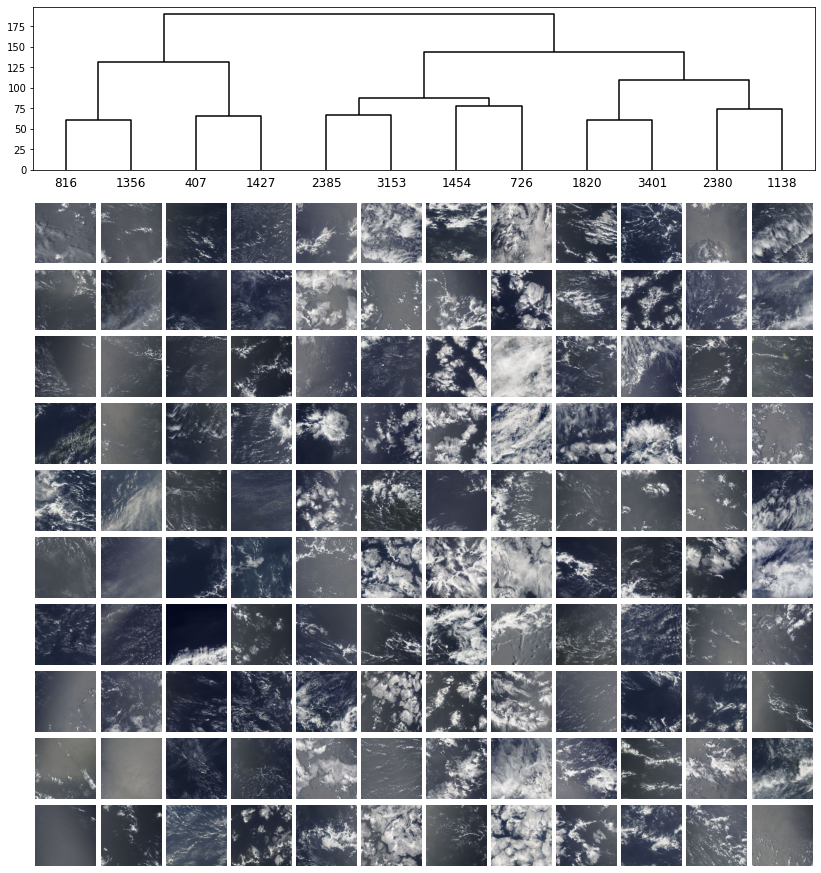

In [11]:
clusters = convml_tt.interpretation.plots.dendrogram(da_embeddings, n_samples=10, n_clusters_max=12)

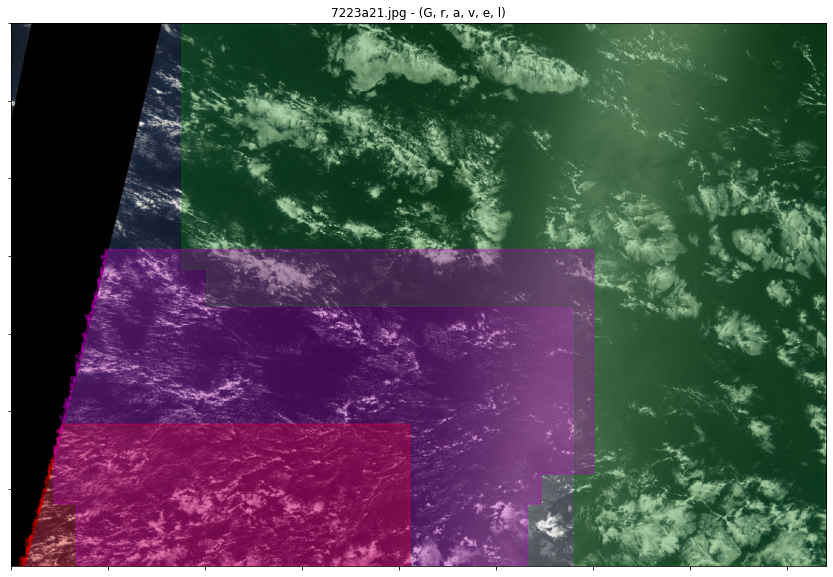

100%|██████████| 2/2 [00:02<00:00,  1.35s/it]
Number of coordinates : 48
[441, 0, 1658, 1398]
[441, 256, 1658, 1398]
[441, 512, 1658, 1398]
[441, 768, 1658, 1398]
[441, 1024, 1658, 1398]
[441, 1280, 1658, 1398]
[697, 0, 1658, 1398]
[697, 256, 1658, 1398]
[697, 512, 1658, 1398]
[697, 768, 1658, 1398]
[697, 1024, 1658, 1398]
[697, 1280, 1658, 1398]
[953, 0, 1658, 1398]
[953, 256, 1658, 1398]
[953, 512, 1658, 1398]
[953, 768, 1658, 1398]
[953, 1024, 1658, 1398]
[953, 1280, 1658, 1398]
[1209, 0, 1658, 1398]
[1209, 256, 1658, 1398]
[1209, 512, 1658, 1398]
[1209, 768, 1658, 1398]
[1209, 1024, 1658, 1398]
[1209, 1280, 1658, 1398]
[1465, 0, 1658, 1398]
[1465, 256, 1658, 1398]
[1465, 512, 1658, 1398]
[1465, 768, 1658, 1398]
[1465, 1024, 1658, 1398]
[1465, 1280, 1658, 1398]
[24, 1034, 1004, 365]
[24, 1290, 1004, 365]
[24, 1546, 1004, 365]
[112, 584, 1389, 812]
[112, 840, 1389, 812]
[112, 1096, 1389, 812]
[112, 1352, 1389, 812]
[112, 1608, 1389, 812]
[368, 584, 1389, 812]
[368, 840, 1389, 812]
[3

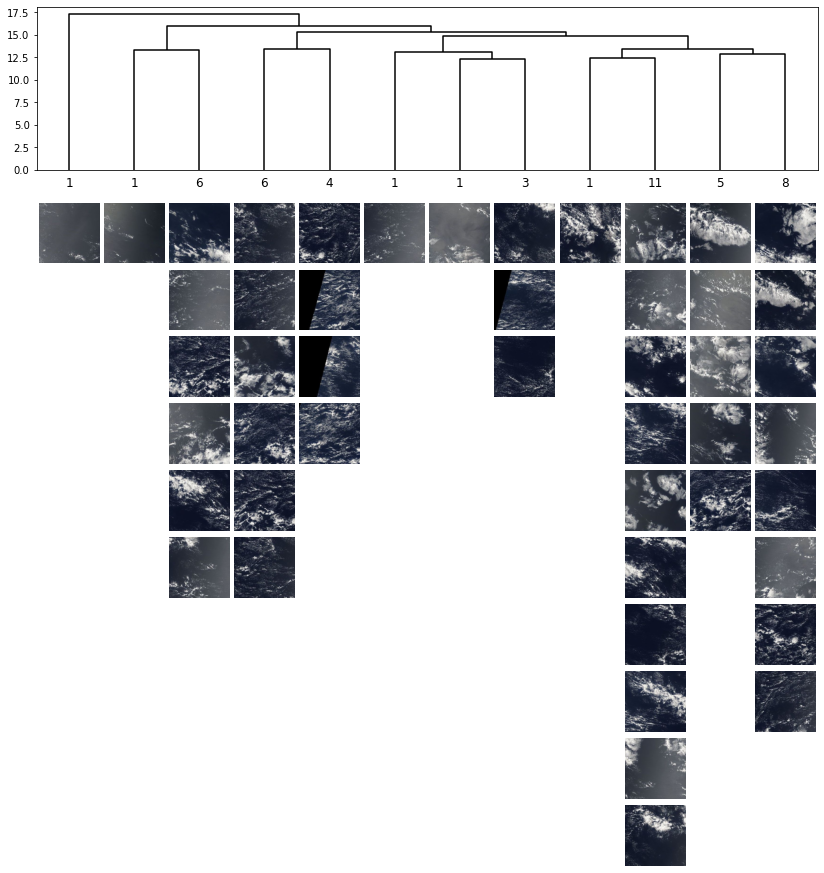

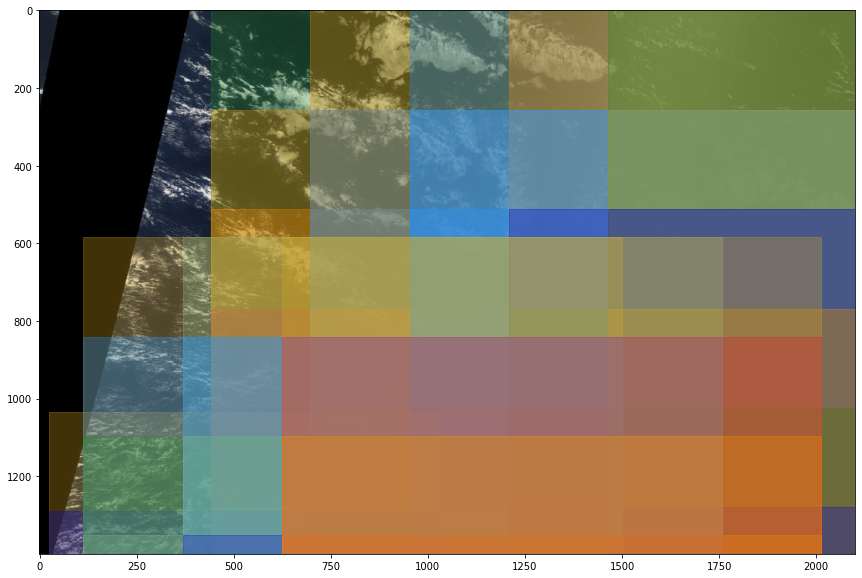

In [71]:

def visualize_domain(sample):
    tmp_dataset_path =  '../NC/tmp'
    for filename in os.listdir(tmp_dataset_path+"/train/"):
        file_path = os.path.join(tmp_dataset_path+"/train/", filename)
        try:
            if os.path.isfile(file_path) or os.path.islink(file_path):
                os.unlink(file_path)
            elif os.path.isdir(file_path):
                shutil.rmtree(file_path)
        except Exception as e:
            print('Failed to delete %s. Reason: %s' % (file_path, e))
    coordinates = []
    t = 0
    
    fig, ax = plt.subplots(figsize=(15, 10))
    img_path = os.path.join(DATASET_DIR, 'train_images', sample[0])
    img = cv2.imread(img_path, 1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Get annotations
    labels = df[df['Image_Label'].str.contains(sample[0])]['EncodedPixels']

    patches = []
    for idx, rle in enumerate(labels.values):
        if rle is not np.nan:
            mask = rle2mask(rle)
            contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

            cnts = sorted(contours, key=cv2.contourArea, reverse=True)
            rois = []
            # Find bounding box and extract ROI
            xvs,yvs,wvs,hvs = [], [], [], []
            for c in cnts:
                xv,yv,wv,hv = cv2.boundingRect(c)
                xvs.append(xv)
                yvs.append(yv)
                wvs.append(wv)
                hvs.append(hv)
                #break
            #print("Contours : "+str(contours))
            rgbImages = extract_contour(img, contours, shown=shown)
            da = 0
            for rgbImg in rgbImages:
                rgbImg = cv2.cvtColor(rgbImg, cv2.COLOR_BGR2RGB)
                for x in range(0, rgbImg.shape[0], 256):
                    for y in range(0, rgbImg.shape[1], 256):
                        if rgbImg[x:x+256,y:y+256].shape != (256, 256, 3):# or  [0,0,0] in rgbImg[x:x+256,y:y+256]:
                            continue
                        
                        tm = t
                        coordinates.append([xvs[da]+x,yvs[da]+y, wvs[da], hvs[da]])
                        out_name = TILE_FILENAME_FORMAT.format(triplet_id=tm,tile_type='anchor')
                        out_name = '../NC/tmp/train/'+out_name
                        cv2.imwrite(out_name,rgbImg[x:x+256,y:y+256])
                        t += 1
                        labs.append(idx)
                da += 1
            for contour in contours:
                poly_patch = Polygon(contour.reshape(-1, 2), closed=True, linewidth=2, edgecolor=COLORS[idx], facecolor=COLORS[idx], fill=True)
                patches.append(poly_patch)
    p = PatchCollection(patches, match_original=True, cmap=matplotlib.cm.jet, alpha=0.3)
    ax.imshow(img/255)
    ax.set_title('{} - ({})'.format(sample[0], ', '.join(sample[1].astype(np.str))))
    ax.add_collection(p)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    plt.show()
    
    tmp_tile_dataset = ImageSingletDataset(data_dir=tmp_dataset_path, tile_type=TileType.ANCHOR)
    tmp_da_embeddings = get_embeddings(tile_dataset=tmp_tile_dataset, model=model)
    tmp_clusters = convml_tt.interpretation.plots.dendrogram(tmp_da_embeddings, n_samples=10, n_clusters_max=12, return_clusters=True)

    fig, ax = plt.subplots(figsize=(15, 10))
    colors = ['red', 'azure', 'forestgreen', 'mediumblue', 'goldenrod', 'olivedrab', 'chocolate', 'darkseagreen', 'steelblue', 'dodgerblue', 'crimson', 'darkorange']
    # Display the image
    #rgbImg = cv2.cvtColor(rgbImg, cv2.COLOR_BGR2RGB)
    ax.imshow(img/255)

    # Create a Rectangle patch
    cnt = 0
    print("Number of coordinates : "+str(len(coordinates)))
    for coordinate in coordinates:
        print(coordinate)
        rect = rectan((coordinate[0], coordinate[1]), coordinate[2], coordinate[3], linewidth=1, facecolor=colors[tmp_clusters[1][cnt]]  , edgecolor=colors[tmp_clusters[1][cnt]], fill=True,  alpha=0.3)
        #poly_patch = Polygon(contour.reshape(-1, 2), closed=True, linewidth=2, edgecolor=COLORS[idx], facecolor=COLORS[idx], fill=True)
        #patches.append(poly_patch)
        cnt += 1
        # Add the patch to the Axes
        ax.add_patch(rect)

    plt.show()




member = randint(0, len(train_samples))
visualize_domain(train_samples[member])


(40,)
40


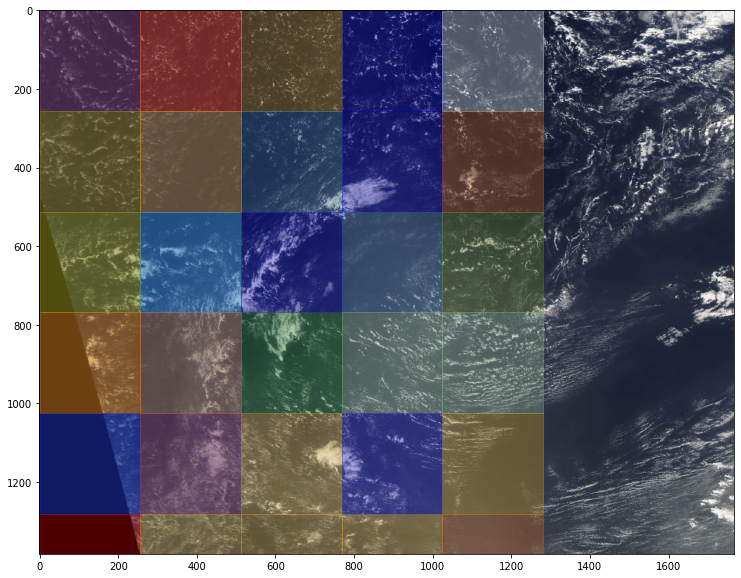

In [33]:

print(tmp_clusters[1].shape)
print(len(coordinates))





In [13]:
from sklearn.metrics import confusion_matrix
cfs_mat = confusion_matrix(labs, clusters[1])

TypeError: 'AxesSubplot' object is not subscriptable

In [24]:
print(cfs_mat[:4,:])

[[238  49 385 539 315 419 327 516 192 426 256 590]
 [313  86 724 558 363 653 531 986 365 852 318 991]
 [205  34 286 244 102 309 331 384 186 388 204 429]
 [720 153 848 244 134 424 545 661 511 798 533 798]]


(4, 12)
(4,)
(12, 4)


<AxesSubplot:>

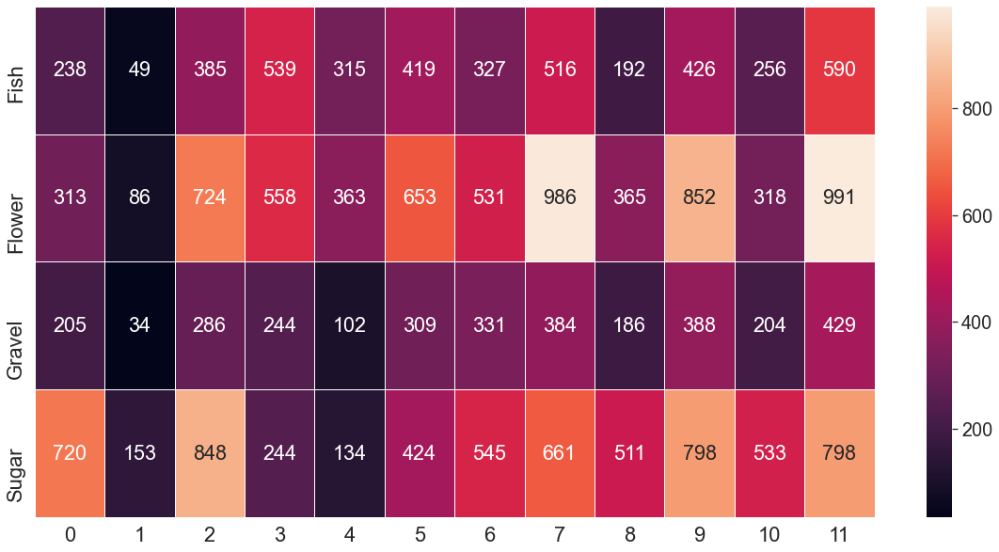

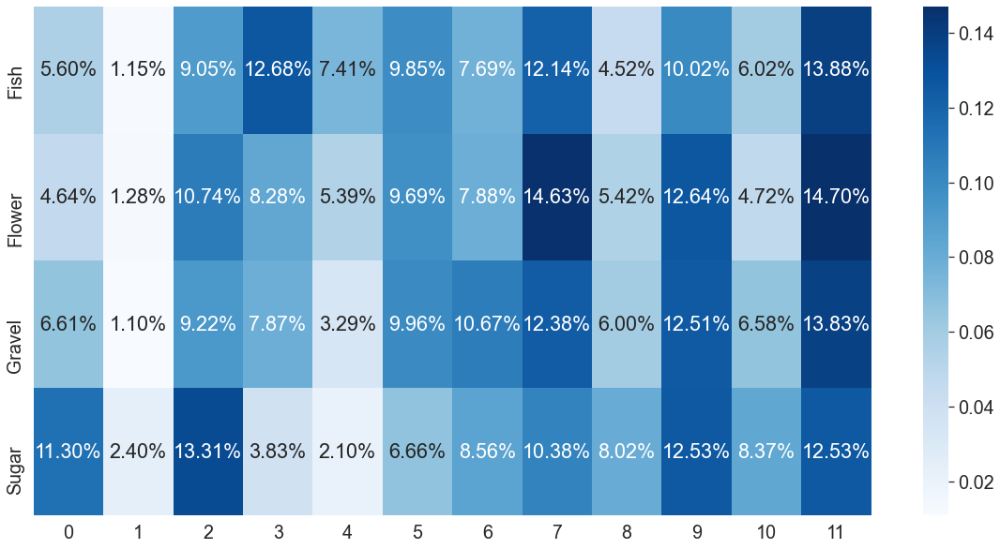

In [64]:
import seaborn as sns
associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
fig, ax = plt.subplots(figsize=(20,10)) 
sns.set(font_scale=1.8)
sns.heatmap(cfs_mat[:4,:], annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
fig, ax = plt.subplots(figsize=(20,10))
print(cfs_mat[:4,:].shape)
print(   np.sum(  cfs_mat[:4,:], axis=1  ).shape  )
print(   (  cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)    ).shape  )
sns.heatmap( (cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)

[[  28. 1159.  394.   23.  143.  696.  470.  473.   98.  364.  138.  267.]
 [ 719.  138. 1503.  519.  921.  289.  487.  399.  318.  201.  634.  613.]
 [ 502.  121.   95.   22.  186.  279.  504.  478.   28.  404.   55.  428.]
 [ 359.  129.  386.  189. 1150.  972.  310.  388.  439. 1866.  134.   47.]]
(4, 12)
(4,)
(12, 4)


<AxesSubplot:>

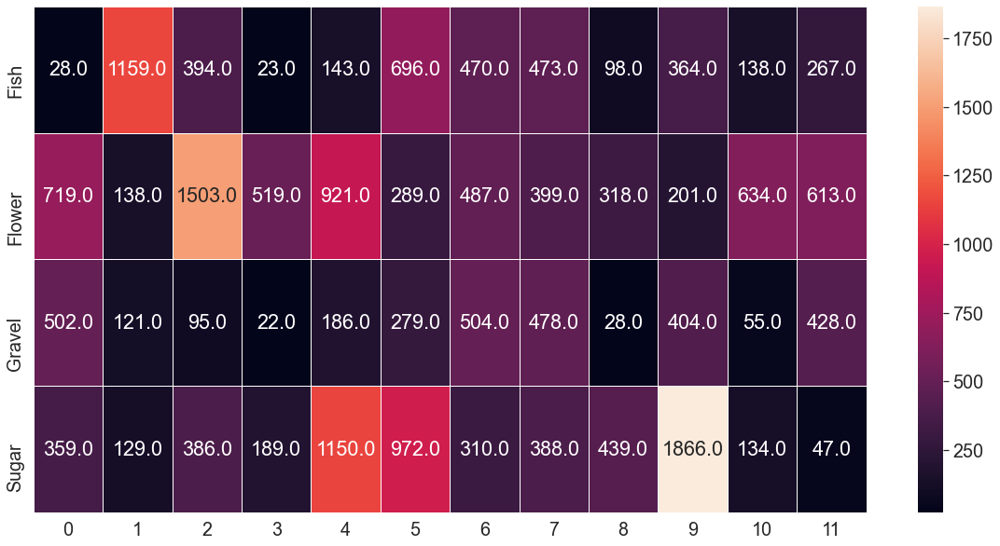

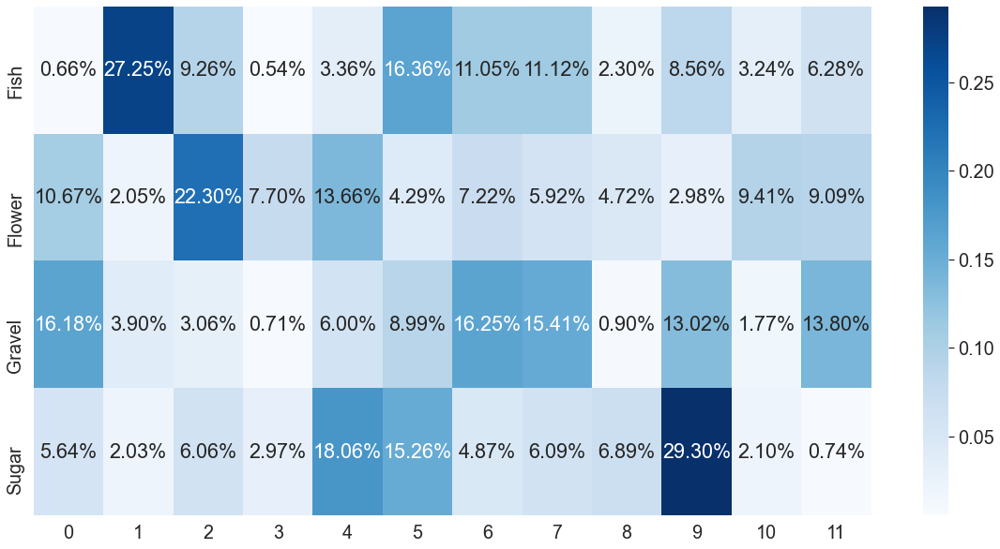

In [26]:
import seaborn as sns
associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
numbers = [4252,6740, 3102, 6369]
conf_mat = []
for num in numbers:
    row = np.random.dirichlet(np.ones(12),size=1)*num
    #print(row)
    conf_mat.append(np.round(row[0]))
cfs_mat = np.array(conf_mat)
print(cfs_mat)
#cfs_mat = confusion_matrix(labs, clusters[1])
fig, ax = plt.subplots(figsize=(20,10)) 
sns.set(font_scale=1.8)
sns.heatmap(cfs_mat[:4,:], annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
fig, ax = plt.subplots(figsize=(20,10))
print(cfs_mat[:4,:].shape)
print(   np.sum(  cfs_mat[:4,:], axis=1  ).shape  )
print(   (  cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)    ).shape  )
sns.heatmap( (cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)

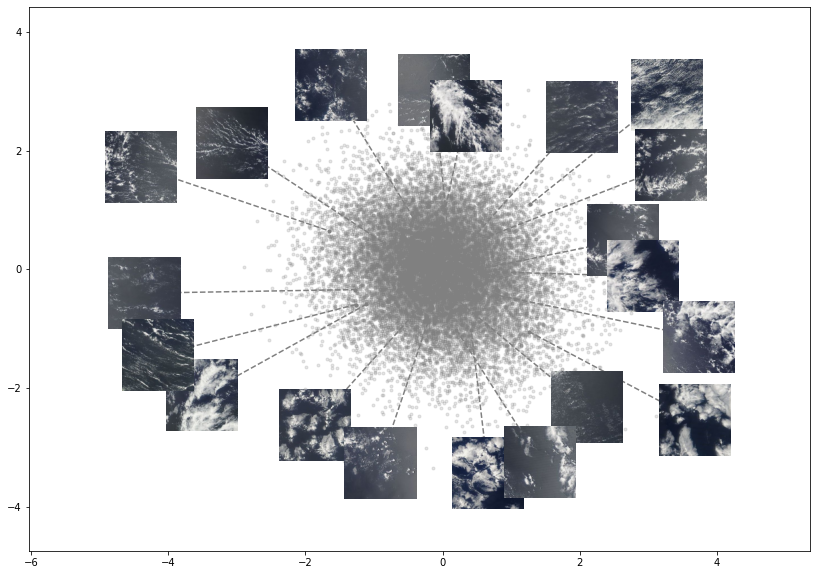

In [11]:
import numpy as np
import matplotlib.pyplot as plt
x = da_embeddings.sel(emb_dim=0)
y = da_embeddings.sel(emb_dim=1)
#fig, ax = plt.subplots(figsize=(8,6))
ax = None
_ = convml_tt.interpretation.plots.annotated_scatter_plot(x=x, y=y, points=20, ax=ax)